## Welcome to the Behavioral Cloning (self driving) Project

 **Project Description**


This project goes beyond simply building a machine learning model—it focuses on developing a robust behavioral cloning system capable of mimicking human driving behavior based on visual input from front-facing cameras. The objective is to train a deep learning model that can accurately predict steering angles from road images, enabling autonomous vehicles to navigate safely in various driving conditions.

Emphasis is placed not only on achieving low training loss but also on real-world performance, where decisions made by the model directly affect safety. The approach includes comprehensive data preprocessing, image augmentation techniques to simulate diverse road environments, and careful model architecture selection to ensure generalization, reduce overfitting, and improve stability during autonomous navigation.




**💼 Business Statement**

To build an intelligent and reliable behavioral cloning system that empowers self-driving vehicles to make safe and accurate steering decisions based on visual perception. This project aims to contribute to the future of autonomous driving by delivering a production-ready model that improves lane-keeping performance, mimics human-like responses to road scenarios, and enhances overall road safety in real-time conditions.

In [1]:
## Cloning my saved driving images on my github repo

!git clone  https://github.com/PATRICK079/Patrick-cloning-data.git

Cloning into 'Patrick-cloning-data'...
remote: Enumerating objects: 18620, done.
remote: Total 18620 (delta 0), reused 0 (delta 0), pack-reused 18620 (from 1)
Receiving objects: 100% (18620/18620), 236.29 MiB | 23.16 MiB/s, done.
Updating files: 100% (18617/18617), done.


**📥 Data Ingestion from GitHub Repository**


The dataset used for this project consists of driving images and corresponding steering angle logs captured during manual driving sessions in the udacity self driving simulator. These files were saved and uploaded to a dedicated folder on my GitHub repository.

To ingest the data:

The images were downloaded directly from the GitHub repo and stored locally for training.

A CSV log file (driving_log.csv) containing metadata such as image paths, steering angles, throttle, brake, and speed was used to link each image to its driving behavior.

Paths were programmatically corrected to match the local file system after download

In [4]:
!ls Patrick-cloning-data

driving_log.csv  IMG


In [5]:
## Importing the necessary libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import keras
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
import cv2
import matplotlib.image as mpimg
import tensorflow as tf
from keras.optimizers import Adam
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import random
import ntpath
import os
import warnings
warnings.filterwarnings('ignore')

In [7]:
datadir = 'Patrick-cloning-data'

In [8]:
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']

In [9]:
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'),names = columns)
pd.set_option('display.max_colwidth',1)


In [10]:
data.head()

,center,left,right,steering,throttle,reverse,speed
0,/Users/sot/Desktop/RESUME/DATA/IMG/center_2025_07_14_14_03_53_643.jpg,/Users/sot/Desktop/RESUME/DATA/IMG/left_2025_07_14_14_03_53_643.jpg,/Users/sot/Desktop/RESUME/DATA/IMG/right_2025_07_14_14_03_53_643.jpg,0.0,0.0,0.0,0.000082
1,/Users/sot/Desktop/RESUME/DATA/IMG/center_2025_07_14_14_03_53_745.jpg,/Users/sot/Desktop/RESUME/DATA/IMG/left_2025_07_14_14_03_53_745.jpg,/Users/sot/Desktop/RESUME/DATA/IMG/right_2025_07_14_14_03_53_745.jpg,0.0,0.0,0.0,0.000078
2,/Users/sot/Desktop/RESUME/DATA/IMG/center_2025_07_14_14_03_53_852.jpg,/Users/sot/Desktop/RESUME/DATA/IMG/left_2025_07_14_14_03_53_852.jpg,/Users/sot/Desktop/RESUME/DATA/IMG/right_2025_07_14_14_03_53_852.jpg,0.0,0.0,0.0,0.000083
3,/Users/sot/Desktop/RESUME/DATA/IMG/center_2025_07_14_14_03_53_954.jpg,/Users/sot/Desktop/RESUME/DATA/IMG/left_2025_07_14_14_03_53_954.jpg,/Users/sot/Desktop/RESUME/DATA/IMG/right_2025_07_14_14_03_53_954.jpg,0.0,0.0,0.0,0.000078
4,/Users/sot/Desktop/RESUME/DATA/IMG/center_2025_07_14_14_03_54_054.jpg,/Users/sot/Desktop/RESUME/DATA/IMG/left_2025_07_14_14_03_54_054.jpg,/Users/sot/Desktop/RESUME/DATA/IMG/right_2025_07_14_14_03_54_054.jpg,0.0,0.0,0.0,0.000081


In [11]:
## creating a function using the 'NTHPATH' to cut out the image directory

def path_lead(path):
  head, tail = ntpath.split(path)
  return tail

In [12]:
data['center'] = data['center'].apply(path_lead)
data['left'] = data['left'].apply(path_lead)
data['right'] = data['right'].apply(path_lead)

In [13]:
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2025_07_14_14_03_53_643.jpg,left_2025_07_14_14_03_53_643.jpg,right_2025_07_14_14_03_53_643.jpg,0.0,0.0,0.0,0.000082
1,center_2025_07_14_14_03_53_745.jpg,left_2025_07_14_14_03_53_745.jpg,right_2025_07_14_14_03_53_745.jpg,0.0,0.0,0.0,0.000078
2,center_2025_07_14_14_03_53_852.jpg,left_2025_07_14_14_03_53_852.jpg,right_2025_07_14_14_03_53_852.jpg,0.0,0.0,0.0,0.000083
3,center_2025_07_14_14_03_53_954.jpg,left_2025_07_14_14_03_53_954.jpg,right_2025_07_14_14_03_53_954.jpg,0.0,0.0,0.0,0.000078
4,center_2025_07_14_14_03_54_054.jpg,left_2025_07_14_14_03_54_054.jpg,right_2025_07_14_14_03_54_054.jpg,0.0,0.0,0.0,0.000081


In [14]:
##  checkig the the steering angle data in my  dataset.

num_bins = 25
hist, bins = np.histogram(data['steering'], num_bins)
print(bins)

[-1.   -0.92 -0.84 -0.76 -0.68 -0.6  -0.52 -0.44 -0.36 -0.28 -0.2  -0.12
 -0.04  0.04  0.12  0.2   0.28  0.36  0.44  0.52  0.6   0.68  0.76  0.84
  0.92  1.  ]


<BarContainer object of 25 artists>

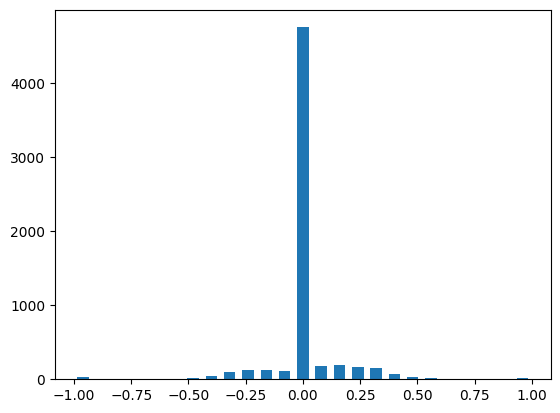

In [15]:
## creating the histogram of the steering angle data.

num_bins = 25
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)

We observed that the dataset is really biased toward straight driving, with over 4,000 samples having a steering angle of exactly 0.0. This imbalance is indeed a significant issue.

The model could learn to predict a steering angle of 0.0 by default, even in situations where a turn is necessary.

To ensure the model can generalize well and handle curves effectively, i will  address this imbalance by reducing the dominance of straight-driving samples and improving the representation of turning behaviors in the dataset.

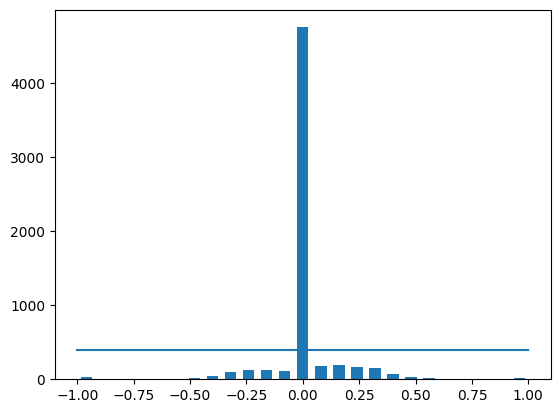

In [16]:
num_bins = 25
samples_per_bin = 400 # my threshold
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [14]:
print('total data:', len(data))
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))


total data: 6205
removed: 4354
remaining: 1851


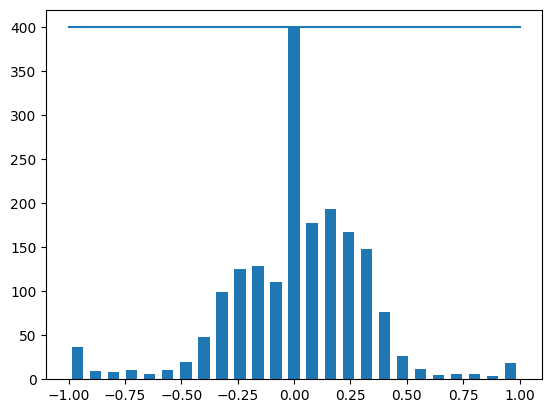

In [15]:
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

Addressing the imbalance in steering angle data required careful experimentation. Initially, I tested various thresholds—100, 200, 250, and 300—to limit the number of samples with a steering angle of exactly 0.0. After multiple trials and evaluations, 400 was identified as the optimal threshold. It provided a better balance between preserving enough straight-driving behavior and reducing the model's bias toward predicting 0.0 in all situations.

In [17]:
## Getting my center paths and corresponding steering angles

print(data.iloc[1])
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

center      center_2025_07_14_14_03_53_745.jpg
left        left_2025_07_14_14_03_53_745.jpg  
right       right_2025_07_14_14_03_53_745.jpg 
steering    0.0                               
throttle    0.0                               
reverse     0.0                               
speed       0.000078                          
Name: 1, dtype: object


Please Note: This project represents a simple baseline implementation, as it is my first behavioral cloning project. At this stage, I have chosen to use only the center camera images paired with their corresponding steering angles.
Recovery scenarios involving left and right camera images, along with steering angle correction, are intentionally excluded for now. These enhancements will be considered in future iterations as I build upon this foundational work.

In [18]:
image_paths, steerings = load_img_steering(datadir + '/IMG', data)

In [19]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=42)


In [20]:
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 4964
Valid Samples: 1241


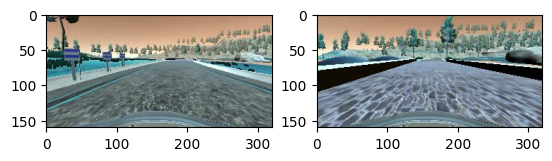

In [20]:
## Visualizing Samples from the Training and Validation Sets

plt.subplot(1, 2, 1)
plt.imshow(cv2.imread(X_train[10]))
plt.subplot(1, 2, 2)
plt.imshow(cv2.imread(X_valid[10]))

Text(0.5, 1.0, 'Validation set')

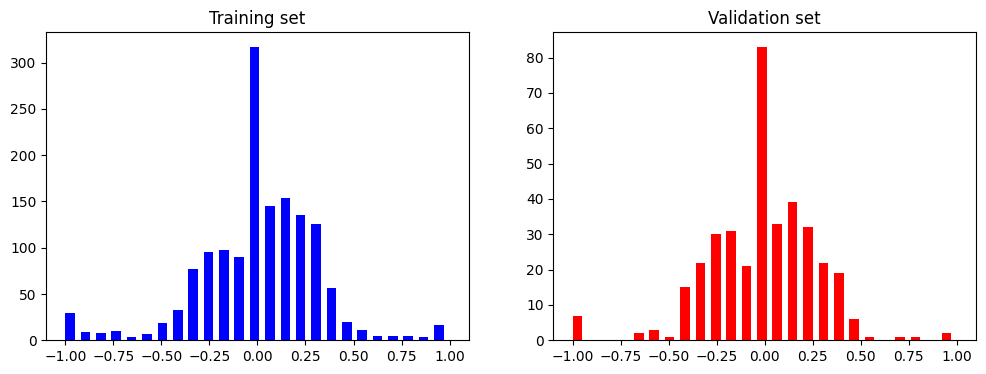

In [21]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

## Image Preprocessing

In this image preprocessing phase, I will apply each preprocessing step separately to visualize their individual effects on the input images. This will help ensure that each transformation contributes meaningfully to the final result.

The preprocessing steps include:

1. Cropping to remove irrelevant parts of the image and reduce noise

2. Color space conversion from RGB to YUV, as recommended by NVIDIA's behavioral cloning model.

3. Gaussian blur to smoothing the images.

4. Resizing to a smaller resolution suitable for model input.

5. Normalization (scaling) to bring pixel values to a standard range.

After testing and visualizing these steps independently, I will combine them into a single comprehensive preprocessing function for use in the training pipeline.


In [22]:
## Function to read the image

def img_preprocess(img):
  img = mpimg.imread(img)
  return img

Text(0.5, 1.0, 'Preprocessed Image')

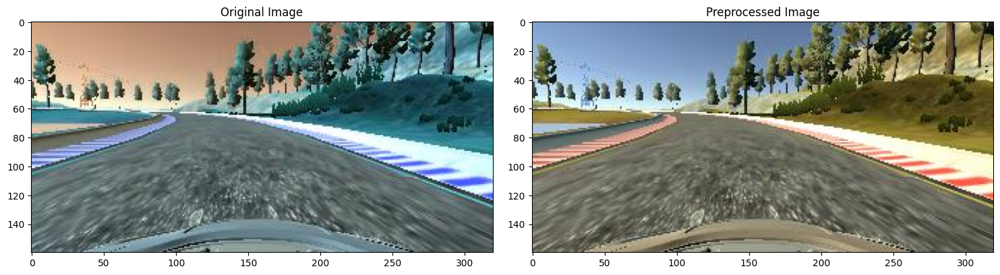

In [23]:
image = image_paths[100]
original_image = cv2.imread(image)
preprocessed_image = img_preprocess(image)

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(preprocessed_image)
axes[1].set_title('Preprocessed Image')

### 1. Cropping

In [26]:
def img_preprocess(img):
  img = mpimg.imread(img)
  img = img[60:135,:,:]
  return img

Text(0.5, 1.0, 'Preprocessed Image')

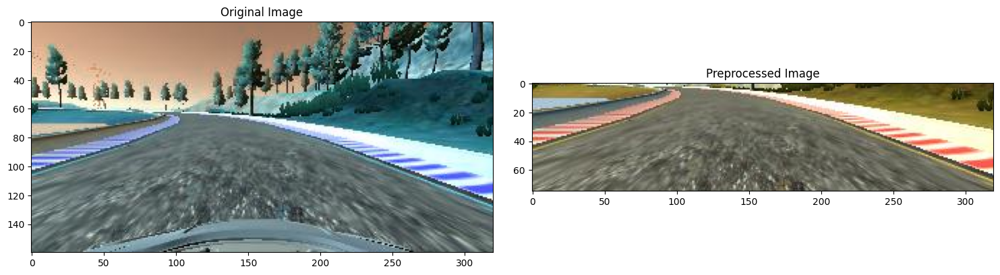

In [27]:

image = image_paths[100]
original_image = cv2.imread(image)
preprocessed_image = img_preprocess(image)

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(preprocessed_image)
axes[1].set_title('Preprocessed Image')


2. Color Conversion

In [28]:
def img_preprocess(img):
  img = mpimg.imread(img)
  img = img[60:135,:,:]
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
  return img

  ## NVIDIA model recommends YUV for dataset rather than RGB wwhen using the NVIDA MODEL

Text(0.5, 1.0, 'Preprocessed Image')

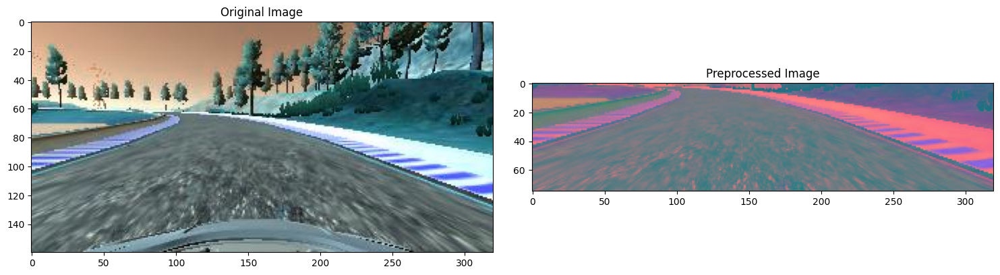

In [29]:
image = image_paths[100]
original_image = cv2.imread(image)
preprocessed_image = img_preprocess(image)

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(preprocessed_image)
axes[1].set_title('Preprocessed Image')

## Gaussian blurring

In [ ]:
def img_preprocess(img):
  img = mpimg.imread(img)
  img = img[60:135,:,:]
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
  img = cv2.GaussianBlur(img,  (3, 3), 0)
  return img

Text(0.5, 1.0, 'Preprocessed Image')

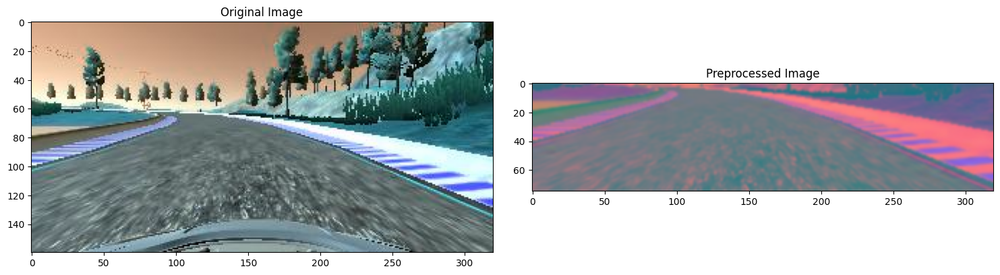

In [ ]:
image = image_paths[100]
original_image = cv2.imread(image)
preprocessed_image = img_preprocess(image)

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(preprocessed_image)
axes[1].set_title('Preprocessed Image')

## 4. Resizing

In [ ]:
def img_preprocess(img):
  img = mpimg.imread(img)
  img = img[60:135,:,:]
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
  img = cv2.GaussianBlur(img,  (3, 3), 0)
  img = cv2.resize(img, (200, 66))
  return img

Text(0.5, 1.0, 'Preprocessed Image')

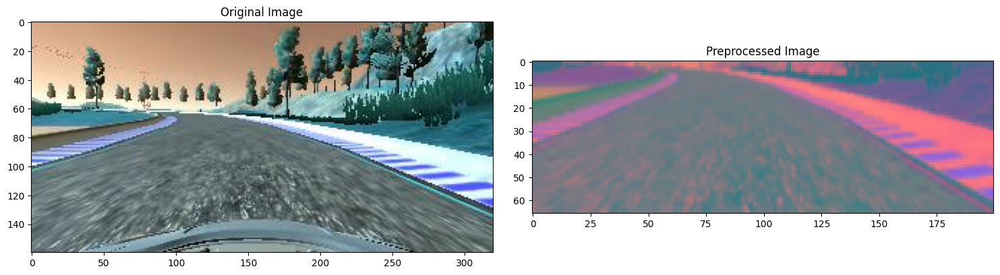

In [ ]:
image = image_paths[100]
original_image = cv2.imread(image)
preprocessed_image = img_preprocess(image)

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(preprocessed_image)
axes[1].set_title('Preprocessed Image')

## 5. Scaling

In [30]:
def img_preprocess(img):
  img = mpimg.imread(img)
  img = img[60:135,:,:]
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
  img = cv2.GaussianBlur(img,  (3, 3), 0)
  img = cv2.resize(img, (200, 66))
  img = img/255
  return img

Text(0.5, 1.0, 'Preprocessed Image')

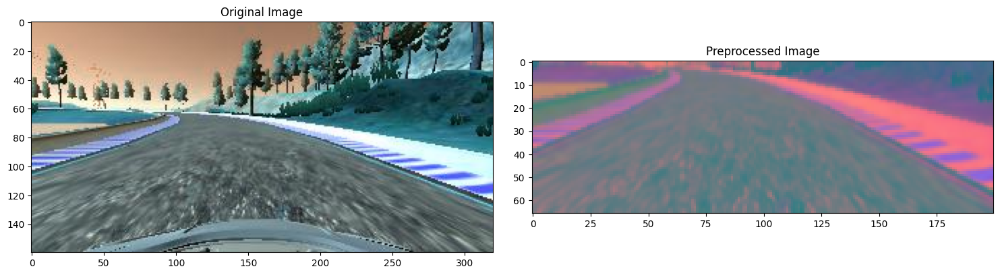

In [31]:
image = image_paths[100]
original_image = cv2.imread(image)
preprocessed_image = img_preprocess(image)

fig, axes = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('Original Image')
axes[1].imshow(preprocessed_image)
axes[1].set_title('Preprocessed Image')

From the images above, we can observe that each preprocessing stage has a noticeable effect on the original image except for the scaling stage, which affects the image array values but not the visual appearance.

Having verified the impact of each step individually, I will now apply the complete preprocessing function to both the training and validation sets to ensure that all images are consistently processed before being fed into the model.

In [35]:
## Applying the processing function and looping through all images in the train, valid dataset

processed_X_train = np.array(list(map(img_preprocess, X_train)))a
processed_X_val = np.array(list(map(img_preprocess, X_valid)))

(1400, 66, 200, 3)


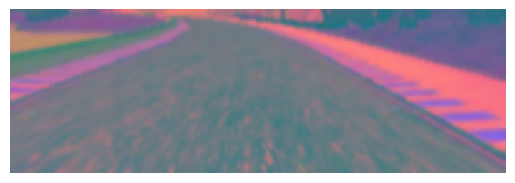

In [36]:
plt.imshow(processed_X_train[random.randint(0, len(processed_X_train) - 1)])
plt.axis('off')
print(processed_X_train.shape)

In [32]:
## Defining the NVIDIA Model Architecture

def nvida_model():
  model = Sequential()
  model.add(Convolution2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Convolution2D(36, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Convolution2D(48, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Convolution2D(64, (3, 3), activation='elu'))
  model.add(Convolution2D(64, (3, 3), activation='elu'))
  model.add(Dropout(0.5))

  model.add(Flatten())

  model.add(Dense(100, activation='elu'))
  model.add(Dropout(0.5))

  model.add(Dense(50, activation='elu'))
  #model.add(Dropout(0.5))

  model.add(Dense(10, activation='elu'))
  #model.add(Dropout(0.5))

  model.add(Dense(1))
  optimizer = Adam(learning_rate=0.001)
  model.compile(optimizer=optimizer, loss='mse')
  return model


In [33]:
model = nvida_model()
print(model.summary())

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 31, 98, 24)     │         1,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 14, 47, 36)     │        21,636 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 5, 22, 48)      │        43,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 3, 20, 64)      │        27,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 1, 18, 64)      │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1, 18, 64)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1152)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 100)            │       115,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │           510 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 252,219 (985.23 KB)

 Trainable params: 252,219 (985.23 KB)

 Non-trainable params: 0 (0.00 B)

None


In [37]:
history = model.fit(processed_X_train, y_train, epochs=30, validation_data=(processed_X_val, y_valid), batch_size=100, verbose=1, shuffle=1)

Epoch 1/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 10s 146ms/step - loss: 0.4310 - val_loss: 0.0798
Epoch 2/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.1105 - val_loss: 0.0711
Epoch 3/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0990 - val_loss: 0.0605
Epoch 4/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0783 - val_loss: 0.0563
Epoch 5/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0769 - val_loss: 0.0598
Epoch 6/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0729 - val_loss: 0.0533
Epoch 7/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - loss: 0.0705 - val_loss: 0.0540
Epoch 8/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.0629 - val_loss: 0.0531
Epoch 9/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0622 - val_loss: 0.0526
Epoch 10/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - loss: 0.0609 - val_loss: 0.0507
Epoch 11/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.0617 - val_loss: 0.0512
Epoch 12/30
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0

Text(0.5, 0, 'Epoch')

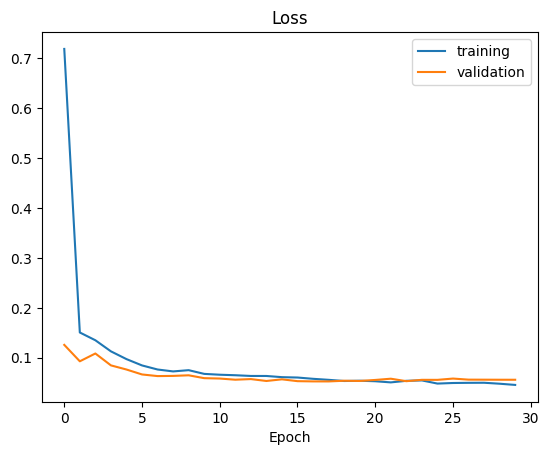

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

**General model insight**

The model's training loss steadily decreased from 0.4310 to 0.0394 over 30 epochs.

Similarly, the validation loss consistently dropped from 0.0798 to 0.0447, indicating that the model is learning effectively without signs of severe overfitting.

Despite the absence of data augmentation, the model performed surprisingly well, maintaining low and stable validation loss throughout training. This is encouraging for a baseline model.

However, to improve the model’s robustness in real-world scenarios, data augmentation is very essential.

I will now save this trained model and test it on the Udacity Self-Driving Car Simulator to evaluate its real-time driving performance and see how well it handles steering decisions based on raw visual input.

In [40]:
model.save('model.h5')

As expected, after testing the model on the Udacity Self-Driving Car Simulator, the car encountered a few challenges. It got stuck, and at certain points, it even drove off into the ocean

 Quite an entertaining moment! 😄

You can watch the full test run here

https://www.loom.com/share/111707b9ca30442bb7b56c7b1eeab0c4?sid=99412bd7-2595-4256-b08c-fd4cba64fd2d

I WILL FINE TUNE THE MODEL TO IMPROVE IT

## IMPROVING THE MODEL

In [3]:
#!pip install imgaug

In [2]:
#!pip install numpy==1.26


In [1]:
from imgaug import augmenters as iaa

## Image Augmentation

Just as I did with the image preprocessing function, I will use the imgaug library to apply data augmentation to my images. Each augmentation technique will be implemented individually so I can visualize its effect before combining them into a single augmentation pipeline.

The augmentation techniques I plan to apply include:

- Zooming

- Horizontal flipping

- Panning (image shifting)

- Brightness alteration

A significant approach for improving the model’s robustness by simulating a variety of real-world driving conditions.

### 1. Zooming

In [26]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image

Text(0.5, 1.0, 'Zoomed Image')

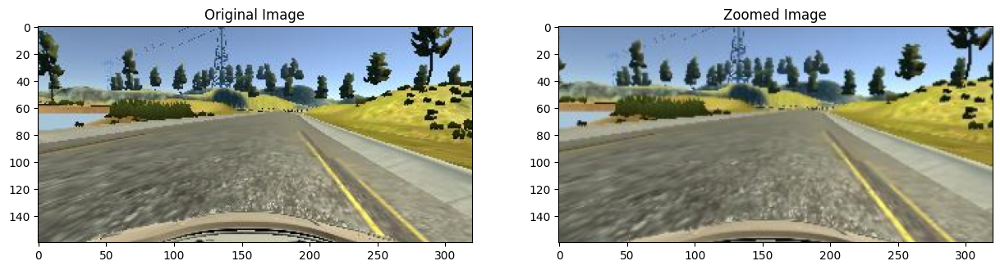

In [27]:
image = image_paths[random.randint(0,1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1,2, figsize = (15, 10))

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')


### 2. Panning

In [28]:
def pan(image):
  pan= iaa.Affine(translate_percent={"x" :(-0.1, 0.1), "y" : (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image

Text(0.5, 1.0, 'Panned Image')

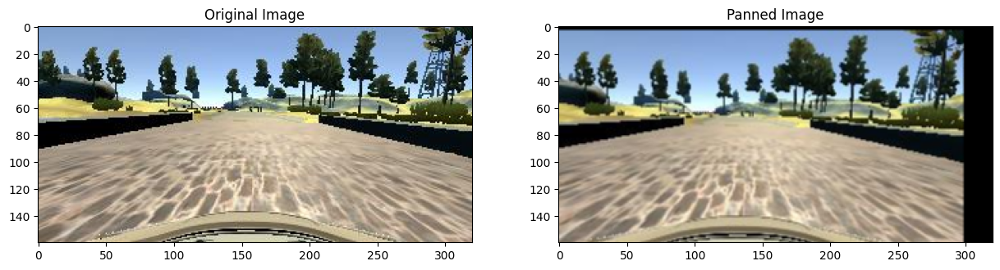

In [24]:
image = image_paths[random.randint(0,1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1,2, figsize = (15, 10))

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

### Altering Brightness

In [29]:
def img_random_brightness(image):
  brigthness= iaa.Multiply((0.2, 1.2))
  image= brigthness.augment_image(image)
  return image

Text(0.5, 1.0, 'Brightness Altered Image')

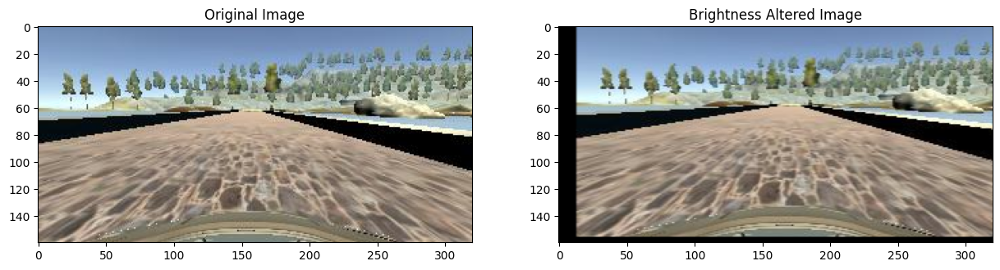

In [26]:
image = image_paths[random.randint(0,1000)]
original_image = mpimg.imread(image)
brightness_altered_image = pan(original_image)

fig, axs = plt.subplots(1,2, figsize = (15, 10))

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image )
axs[1].set_title('Brightness Altered Image' )

## Horinzontal Flipping

In [30]:
def img_random_flip(image, steering_angle):
  image = cv2.flip(image, 1)
  steering_angle = -steering_angle
  return image, steering_angle

Text(0.5, 1.0, 'Flipped Image - Steering Angle:-0.0')

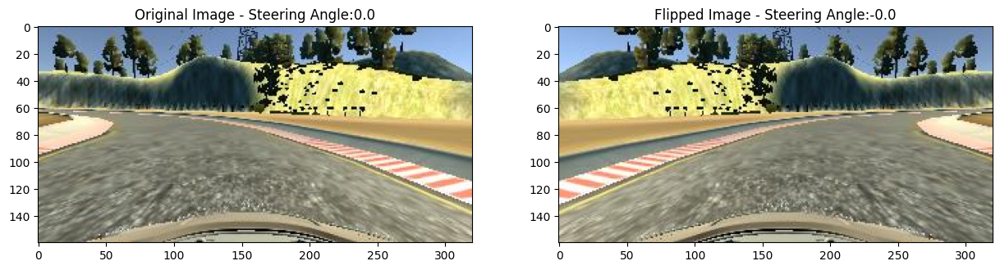

In [28]:
random_index = random.randint(0,1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1,2, figsize = (15, 10))

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image )
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle) )

Please note that applying  augmentation to every image is not really good in behavioral cloning as it will

- Distort the original data too much

- Risk making it unrealistic as too many fake images would be generated

- Might Introduce biases that didn't exist in real driving

- Make your model overfit to fake patterns instead of learning true road features

Hence, i will introduce random augmentation with a  50% probability between 0 and 1



In [31]:
## Defining the random augmentaion function

def random_augment(image, steering_angle):
  image = mpimg.imread(image)
  if np.random.rand() < 0.5:
    image = pan(image)
  if np.random.rand() < 0.5:
    image = zoom(image)
  if np.random.rand() < 0.5:
    image =img_random_brightness(image)
  if np.random.rand() < 0.5:
    image, steering_angle= img_random_flip(image, steering_angle)
  return image, steering_angle

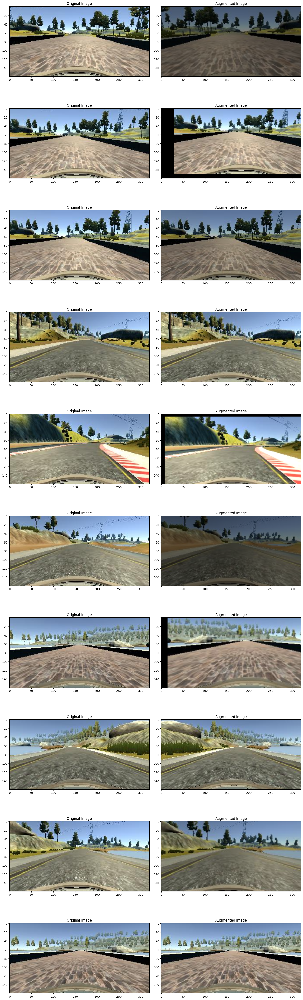

In [32]:
## Displaying 10 images of original and augmented images

ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow,ncol, figsize = (15, 50))
fig.tight_layout()



for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title('Original Image')

  axs[i][1].imshow(augmented_image )
  axs[i][1].set_title('Augmented Image' )

In [33]:
## my image preprocessing function from earlier

def img_preprocess(img):
  img = img[60:135,:,:]
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
  img = cv2.GaussianBlur(img,  (3, 3), 0)
  img = cv2.resize(img, (200, 66))
  img = img/255
  return img

In [34]:
## creating the custom data generator, and this function is essential for feeding images into my model in batches during training.

def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

In [35]:

x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

 calling my custom batch_generator function to generate one image and one steering angle from both  training and validation sets and Inspect if augmentation or preprocessing is working correctly



Text(0.5, 1.0, 'Validation Image')

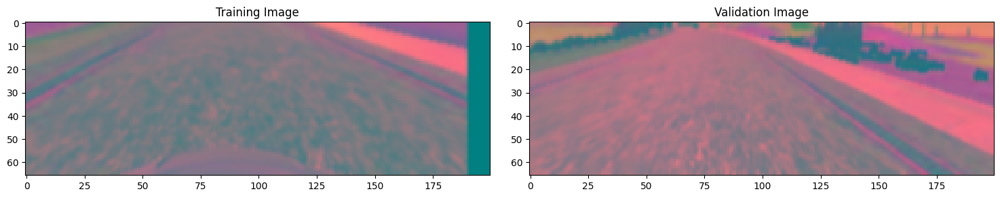

In [34]:
## Viualizing to ensure my batch generator works as expected

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [35]:
def nvida_model():
  model2 = Sequential()
  model2.add(Convolution2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model2.add(Convolution2D(36, (5, 5), strides=(2, 2), activation='elu'))
  model2.add(Convolution2D(48, (5, 5), strides=(2, 2), activation='elu'))
  model2.add(Convolution2D(64, (3, 3), activation='elu'))
  model2.add(Convolution2D(64, (3, 3), activation='elu'))
  #model2.add(Dropout(0.5))

  model2.add(Flatten())

  model2.add(Dense(100, activation='elu'))
  #model2.add(Dropout(0.5))

  model2.add(Dense(50, activation='elu'))
  #model.add(Dropout(0.5))

  model2.add(Dense(10, activation='elu'))
  #model.add(Dropout(0.5))

  model2.add(Dense(1))
  optimizer = Adam(learning_rate=0.001)
  model2.compile(optimizer=optimizer, loss='mse')
  return model2

In [36]:
model2 = nvida_model()

In [37]:
history = model2.fit(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 111s 351ms/step - loss: 0.2855 - val_loss: 0.3553
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 106s 356ms/step - loss: 0.1131 - val_loss: 0.0605
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 104s 349ms/step - loss: 0.0682 - val_loss: 0.0513
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 140s 468ms/step - loss: 0.0578 - val_loss: 0.0557
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 108s 361ms/step - loss: 0.0550 - val_loss: 0.0402
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 133s 444ms/step - loss: 0.0459 - val_loss: 0.0338
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 103s 344ms/step - loss: 0.0425 - val_loss: 0.0353
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 101s 338ms/step - loss: 0.0376 - val_loss: 0.0286
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 103s 345ms/step - loss: 0.0360 - val_loss: 0.0373
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 125s 418ms/step - loss: 0.0331 - val_loss: 0.0259


Text(0.5, 0, 'Epoch')

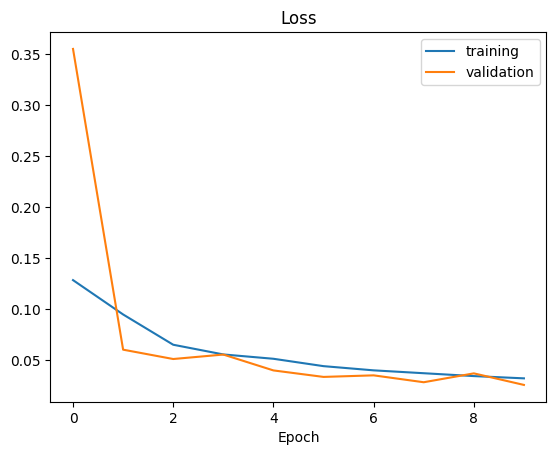

In [38]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

After applying behavioral cloning–specific augmentations (panning, zooming, brightness adjustment, flipping), the model showed significant improvement.

The training loss decreased from 0.2855 to 0.0331, while the validation loss dropped impressively from 0.3553 to 0.0259 over 10 epochs.

This confirms that the augmentation techniques helped the model generalize better to unseen data and reduced overfitting compared to the baseline model.


However, i am going to solve the model and test it on my udacity simulator on 2 tracks

In [37]:
model2.save('model2.h5')

As expected the model performed well, I tested the trained model on two tracks using the Udacity Self-Driving Car Simulator:

🔁 Track 1 — the track from which the training data was originally collected

🌍 Track 2 — a completely unseen track the model had never encountered during training

Despite some slightly inconsistent movement, the model performed significantly better than the first version trained without image augmentation, which struggled and often got stuck.

This improved model was able to navigate both tracks successfully, demonstrating better generalization and robustness.

🎥 You can watch the test runs below:

✅ Seen Track (Track 1):
https://www.loom.com/share/ecf2a4c14dd849d7b5b6f006d7bf9dfa?sid=0953d183-8cec-445d-b334-ce0bacefd521



🚘 Unseen Track (Track 2):

 https://www.loom.com/share/30d6dd3f3a1143588ee17b264be79ee4?sid=3a81cb35-4a32-4a2d-8e19-c3d4e4122c25





The end of the project. Thank you for following along. I have saved the model and will be uploading it to my GitHub repository if you’d like to try it out. Please feel free to reach out if you have any questions.

I am also open to new remote opportunities in data science and machine learning in the autonomous industries. Thank you!



MY Portfolio: https://www.datascienceportfol.io/Patrick090

LINKEDLIN: https://www.linkedin.com/in/patrickedosoma/



# **🚨 Final Note**

Accurately driving your car during the data collection phase in the Udacity Self-Driving Car Simulator is extremely important for building a robust behavioral cloning model.

To ensure your model learns effectively:

🚗 Complete at least 4 laps in the forward (left-turning) direction

🔁 Then reverse the car’s direction and complete another 4 laps in the opposite (right-turning) direction

This balanced data collection approach helps the model understand steering dynamics in both directions, reduces bias toward one turning side, and greatly improves real-world generalization.

Without this method, your model may struggle to learn sufficient steering behaviors and fail on unseen tracks.

